# **Лабораторная работа Image Captioning**

## Задание
В данном задании вашей задачей будет построить простую модель для задачи **Image Captioning** - по изображению (image) сгенерировать текстовый заголовок (caption)

## 0. Скачиваем и распаковываем данные

In [1]:
# import requests
# from urllib.parse import urlencode

# base_url = 'https://cloud-api.yandex.net/v1/disk/public/resources/download?'
# public_key = 'https://disk.yandex.ru/d/W9EODR61Dj1Oxg'

# # Получаем загрузочную ссылку
# final_url = base_url + urlencode(dict(public_key=public_key))
# response = requests.get(final_url)
# download_url = response.json()['href']

# # Загружаем файл и сохраняем его
# download_response = requests.get(download_url)
# with open('dataset.tar.gz', 'wb') as f:   # Здесь укажите нужный путь к файлу
#     f.write(download_response.content)

## 1. Подготовка данных (***4 балла***)

In [2]:
# #!:bash
# ls -sh dataset.tar.gz
# file dataset.tar.gz

In [3]:
# #!:bash
# tar xfz dataset.tar.gz -C .

In [4]:
import torch
import torch.nn as nn
import cv2
import os
import pandas as pd
import numpy as np
import random
import torchvision
from tqdm.auto import tqdm, trange
import matplotlib.pyplot as plt
# %matplotlib widget

In [5]:
data_folder = "../../data"#"./data"  # укажите здесь путь до распакованных данных

dfs = dict()
for split in ['train', 'val']:
    dfs[split] = pd.read_csv(os.path.join(data_folder, f'captions_{split}.tsv'), sep='\t')

dfs['train'].head()

,img_id,caption #0,caption #1,caption #2,caption #3,caption #4
0,0000.png,A child in a pink dress is climbing up a set o...,A girl going into a wooden building .,A little girl climbing into a wooden playhouse .,A little girl climbing the stairs to her playh...,A little girl in a pink dress going into a woo...
1,0001.png,A black dog and a spotted dog are fighting,A black dog and a tri-colored dog playing with...,A black dog and a white dog with brown spots a...,Two dogs of different breeds looking at each o...,Two dogs on pavement moving toward each other .
2,0002.png,A little girl covered in paint sits in front o...,A little girl is sitting in front of a large p...,A small girl in the grass plays with fingerpai...,There is a girl with pigtails sitting in front...,Young girl with pigtails painting outside in t...
3,0003.png,A man lays on a bench while his dog sits by him .,A man lays on the bench to which a white dog i...,a man sleeping on a bench outside with a white...,A shirtless man lies on a park bench with his ...,man laying on bench holding leash of dog sitti...
4,0004.png,A man in an orange hat starring at something .,A man wears an orange hat and glasses .,A man with gauges and glasses is wearing a Bli...,A man with glasses is wearing a beer can croch...,The man with pierced ears is wearing glasses a...


In [6]:
dfs['train'].shape

(6000, 6)

In [7]:
dfs['val'].shape

(500, 6)

<class 'numpy.ndarray'>
(375, 500, 3)


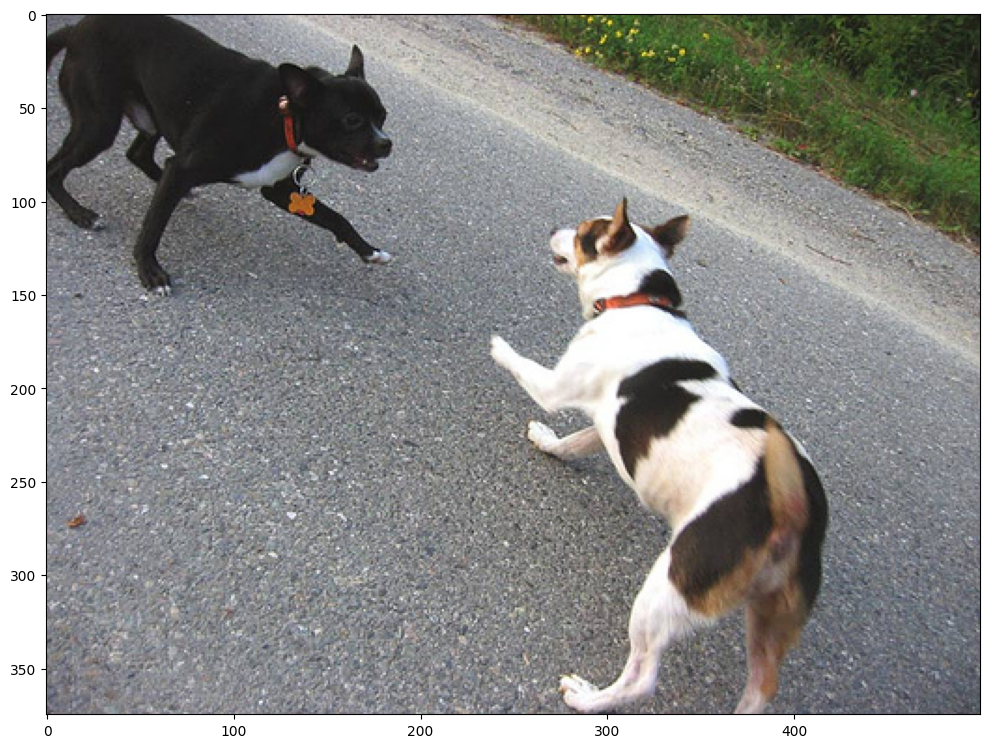

In [8]:
fig, ax = plt.subplots(figsize=(10, 8))
# Для чтения изображений из файлов мы будем использовать библиотеку cv2 --> всё что вам нужно знать
#   функция cv2.imread(path) принимает на вход путь к файлу изображения и возвращает np.array с изображением
#   в порядке h x w x c
image = cv2.imread(os.path.join(data_folder, 'train', '0001.png'))
print(type(image))
print(image.shape)
plt.imshow(image)
plt.tight_layout()

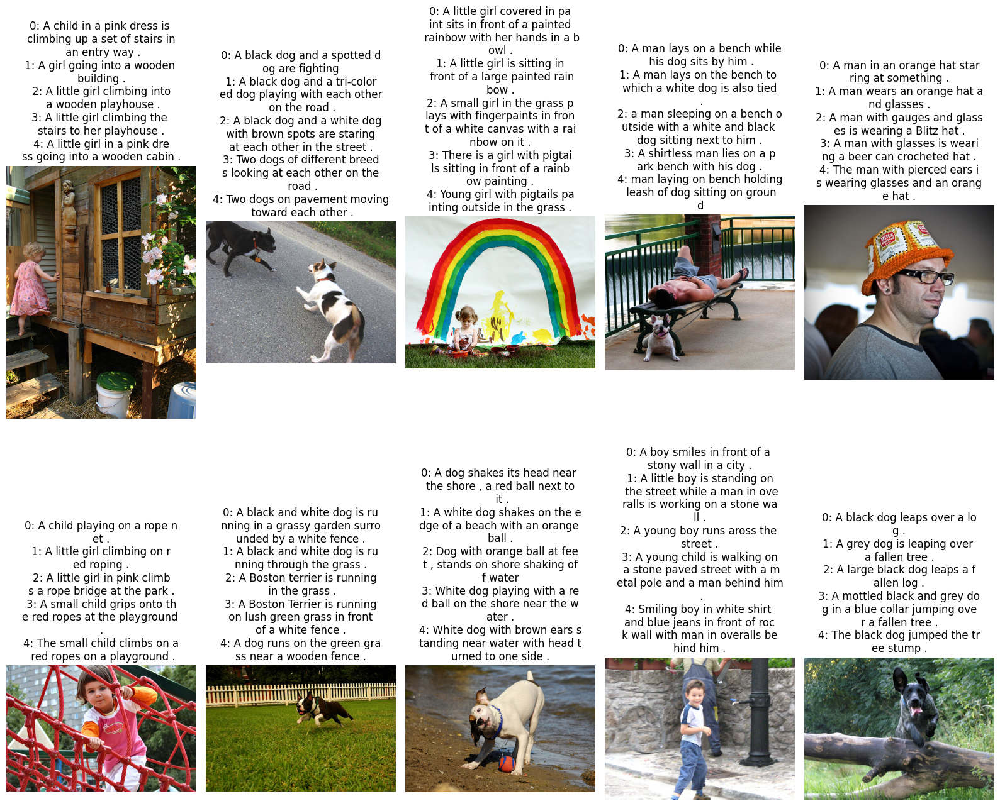

In [9]:
inds = list(range(10))
split = 'train'

h, w = 2, 5
title_width = 30

assert h*w >= len(inds)

fig, ax = plt.subplots(h, w, figsize=(16, 16))

for i, ind in enumerate(inds):
    row = dfs[split].iloc[ind]
    img_id = row['img_id']
    captions = [row[f'caption #{i}'] for i in range(5)]
    
    caption_adjasted = map(lambda el: '\n'.join([(str(el[0]) + ': ' + el[1])[k:k+title_width] for k in range(0, 3 + len(el[1]), title_width)]), enumerate(captions))
    caption = '\n'.join(caption_adjasted)
    plt.subplot(h, w, i+1, )
    plt.title(caption)
    plt.axis('off')
    plt.imshow(cv2.imread(os.path.join(data_folder, split, img_id)))

fig.tight_layout()
plt.show()

### 1.2 Предобработка изображений

**Сперва напишем предобработку для изображений**

In [10]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as tr

В качестве энкодера будем использовать `mobilenet_v3_large`

In [11]:
# mobilenet_v3_large = torchvision.models.mobilenet_v3_large(
#     weights=torchvision.models.MobileNet_V3_Large_Weights.DEFAULT,
#     progress=True
# )

In [12]:
mobilenet_v3_large_transforms = torchvision.models.MobileNet_V3_Large_Weights.IMAGENET1K_V2.transforms()
mobilenet_v3_large_transforms

ImageClassification(
    crop_size=[224]
    resize_size=[232]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

In [76]:
np.array(mobilenet_v3_large_transforms.mean), np.array(mobilenet_v3_large_transforms.std)

(array([0.485, 0.456, 0.406]), array([0.229, 0.224, 0.225]))

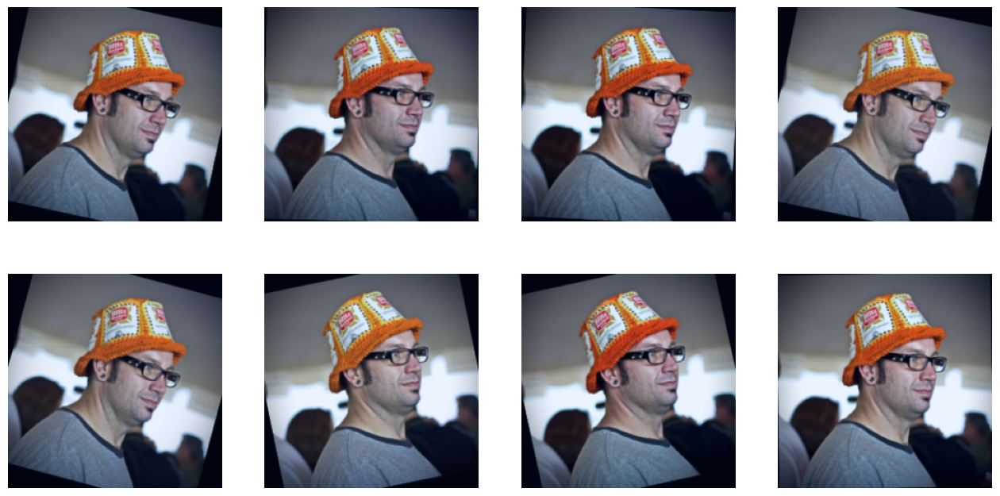

In [13]:
# Подготовьте функцию для аугументации одного изображения

# !!! Напомню, что в выборе аугументаций многое будет зависеть от того,
# !!!  на каких аугументациях училась предобученная модель, которую вы возьмёте,
# !!!  так что рекомендую принимать решение о финальных аугументациях после изучения
# !!!  выбранной вами модели

# Поканальное среднее и стандартное отклонение (как и откуда лучше взять?)
# Взято из нормализации картинок для ResNet
channel_mean = np.array(mobilenet_v3_large_transforms.mean)
channel_std = np.array(mobilenet_v3_large_transforms.std)

image_prepare = tr.Compose([
    tr.ToPILImage(),
    tr.ToTensor(),
    tr.Resize(size=(232, 232), interpolation=tr.InterpolationMode.BILINEAR),
])

image_train_augmentations = tr.Compose([
    tr.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.025, hue=0.02),
    tr.RandomRotation(degrees=15, interpolation=tr.InterpolationMode.BILINEAR),
    tr.Resize(size=(224, 224)),
    tr.Normalize(mean=channel_mean, std=channel_std)
])

# Для валидации рекомендую использовать минимальное количество аугументаций, чтобы
#  замеряться честно - изменения размера, нормализация (все случайные аугументации
#  не делайте для валидации и обязательно для обучения делайте со средним в нуле)
image_prepare_val = tr.Compose([
    tr.ToPILImage(),
    tr.ToTensor(),
    tr.Resize(size=(224, 224), interpolation=tr.InterpolationMode.BILINEAR),
    tr.Normalize(mean=channel_mean, std=channel_std),
])

image_val_augmentations = tr.Compose([
    
])


# Визуализация ваших преобразований на одном изображении (проверка на адекватность)
from sklearn.preprocessing import minmax_scale

image = cv2.imread(os.path.join(data_folder, "train", "0004.png"))
#image = cv2.imread(os.path.join(data_folder, "val", "6006.png"))

def de_normalize(img):
    return minmax_scale(
        (img.reshape(3, -1) + channel_mean[:, None]) * channel_std[:, None],
        feature_range=(0., 1.),
        axis=1,
    ).reshape(*img.shape)

# Проверка на адекватность
fig, ax = plt.subplots(2, 4, figsize=(16, 8))
for i in range(8):
    plt.subplot(2, 4, i+1)
    transformed_image = image_train_augmentations(image_prepare(image)).numpy().transpose(1, 2, 0)
    to_show_image = de_normalize(transformed_image)
    plt.axis('off')
    plt.imshow(to_show_image)
plt.show()

### 1.3 Предобработка заголовков

**Затем напишем предобработку для заголовков**

Для простоты вычислений предлагаю сделать крайне простую токенизацию, пользуясь регулярными выражениями и библиотекой **re**

1. Приводим текст к нижнему регистру
2. Заменяем всю пунктуацию на пробелы
3. Убираем пробельные символы с концов строки
4. Разбиваем по ненулевой последовательности пробельных символов
5. Добавляем специальные токены \<BOS> (begining of sentence) и \<EOS> (end of sentence), чтобы обозначить границы заголовка для модели

In [14]:
import re

def tokenize(text: str) -> str:
    text1 = re.sub(r'[^\w\s]', ' ', text.lower())
    text2 = re.sub(r'\s+', ' ', text1).strip()
    words = re.findall(r'\b\w+\b', text2)
    
    return ['<BOS>', *words, '<EOS>']

# Проверка вашей функции
tokenize("My name is Any0019, I wish you good luck in this lab! Bye-bye :)")

['<BOS>',
 'my',
 'name',
 'is',
 'any0019',
 'i',
 'wish',
 'you',
 'good',
 'luck',
 'in',
 'this',
 'lab',
 'bye',
 'bye',
 '<EOS>']

Соберём словарь из всех слов, что встречаются в заголовках в train
1. Токенизируем заголовки
2. Обновляем частоту всех отдельных токенов
3. Выкидываем все слова встретившиеся меньше `MIN_FREQ` (допустим 3 - можете взять другое число) -> заменяем на специальный `<UNK>` (unknown) токен
4. Записываем быстрое преобразование из токенов в индексы и наоборот

  0%|          | 0/6000 [00:00<?, ?it/s]

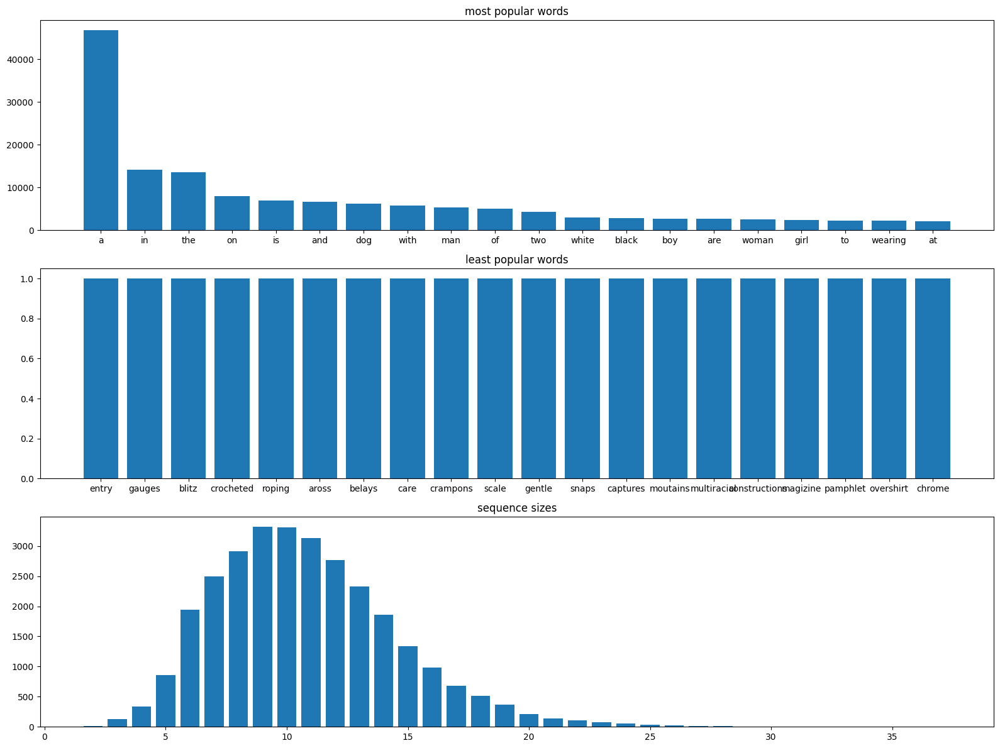

In [15]:
from tqdm.auto import trange
from collections import Counter

# Посчитаем частоту встречаемости различных токенов (не нужно для bos и eos)
vocab_freq = Counter()

# Параллельно заодно посчитаем длины заголовков в токенах (сколько раз встречалась какая длина в токенах)
#  sizes[5] = число заголовков из 5 токенов (без учёта bos и eos)
sizes = Counter()
for i in trange(len(dfs['train'])):
    for j in range(1, 6):
        tokens = tokenize(dfs['train'].iloc[i, j])[1: -1]  # w/o bos, eos
        vocab_freq.update(tokens)
        sizes[len(tokens)] += 1

global_max_seq_len = np.max(list(sizes.keys()))

show_ = 20
fig, ax = plt.subplots(3, 1, figsize=(16, 12))

plt.subplot(312)
vocab_freq = {k: v for k, v in sorted(vocab_freq.items(), key=lambda item: item[1])}
plt.title('least popular words')
plt.bar(list(vocab_freq.keys())[:show_], list(vocab_freq.values())[:show_])

plt.subplot(311)
vocab_freq = {k: v for k, v in sorted(vocab_freq.items(), key=lambda item: item[1], reverse=True)}
plt.title('most popular words')
plt.bar(list(vocab_freq.keys())[:show_], list(vocab_freq.values())[:show_])

plt.subplot(313)
plt.title('sequence sizes')
plt.bar(list(sizes.keys()), list(sizes.values()))

fig.tight_layout()
plt.show()

In [286]:
MIN_FREQ = 3  # токены с частотой ниже этой константы заменяются на <UNK>

# Так же добавляем <PAD> токен для паддингов
tok_to_ind = {
    '<UNK>': 0,
    '<BOS>': 1,
    '<EOS>': 2,
    '<PAD>': 3,
}

ind_to_tok = {
    0: '<UNK>',
    1: '<BOS>',
    2: '<EOS>',
    3: '<PAD>',
}

tok_to_ind.update({token : idx for idx, (token, freq) in enumerate(vocab_freq.items(), start=len(tok_to_ind)) if freq >= MIN_FREQ})

ind_to_tok = {idx : token for token, idx in tok_to_ind.items()}

assert len(tok_to_ind) == len(ind_to_tok)
VOCAB_SIZE = len(tok_to_ind)
print(f"Resulting vocab size: {VOCAB_SIZE} (out of {len(vocab_freq)} tokens overall, due to MIN_FREQ={MIN_FREQ})")

Resulting vocab size: 3478 (out of 7370 tokens overall, due to MIN_FREQ=3)


In [17]:
# Функция возвращает по тексту индексы токенов в тексте
def to_ids(text: str) -> list[int]:
    tokens = tokenize(text)
    ids = []
    unk_idx = tok_to_ind['<UNK>']
    for t in tokens:
        idx = tok_to_ind.get(t)
        ids.append(idx if idx is not None else unk_idx)
    
    return ids

text = "I really hope that you can get a lot of great results with this lab! You're awesome! I believe in you, good luck :)"
toks = tokenize(text)
ids = to_ids(text)

print(list(zip(toks, ids)))

assert toks[0] == '<BOS>' and toks[-1] == '<EOS>'
assert ids[0] == tok_to_ind['<BOS>'] and ids[-1] == tok_to_ind['<EOS>']

[('<BOS>', 1), ('i', 1372), ('really', 2343), ('hope', 0), ('that', 153), ('you', 1173), ('can', 760), ('get', 373), ('a', 4), ('lot', 384), ('of', 13), ('great', 2469), ('results', 0), ('with', 11), ('this', 313), ('lab', 1052), ('you', 1173), ('re', 0), ('awesome', 0), ('i', 1372), ('believe', 0), ('in', 5), ('you', 1173), ('good', 2454), ('luck', 0), ('<EOS>', 2)]


In [18]:
def tokens_to_text(ids: list[int]) -> str:
    text = []
    for idx in ids:
        text.append(ind_to_tok[idx])
        
    return ' '.join(text)

### 1.4 Датасет

**Сделаем класс датасета в стиле torch.utils.data.Dataset**

In [19]:
class ImageCaptioningDataset(Dataset):
    """
        imgs_path ~ путь к папке с изображениями
        captions_path ~ путь к .tsv файлу с заголовками изображений
    """
    def __init__(
        self, 
        imgs_path: str, 
        captions_path: str, 
        train: bool = True
    ) -> None:
        super().__init__()
        # Читаем и записываем из файлов в память класса, чтобы быстро обращаться внутри датасета
        # Если не хватает памяти на хранение всех изображений, то подгружайте прямо во время __getitem__, но это замедлит обучение
        # Проведите всю предобработку, которую можно провести без потери вариативности датасета, здесь
        
        self.train = train
        
        image_names = os.listdir(imgs_path)
        self.num_images = len(image_names)
        
        self.images = []
        
        for img_name in image_names:
            self.images.append(
                image_prepare(cv2.imread(os.path.join(imgs_path, img_name)))
            )
   
        captions_df = pd.read_csv(captions_path, sep='\t')
        
        if len(captions_df) != self.num_images:
            raise ValueError("Different number of images and captions")
        
        self.captions = []
               
        for idx in range(self.num_images):
            self.captions.append([])
            for n in range(1, captions_df.shape[1]):
                #self.captions[idx].append(torch.tensor(to_ids(captions_df.iloc[idx, n]), dtype=torch.int64))
                self.captions[idx].append(to_ids(captions_df.iloc[idx, n]))

    def __getitem__(self, index):
        # Получаем предобработанное изображение (не забудьте отличие при train=True или train=False)
        # Берём все заголовки или только один случайный (случайность должна происходить при каждом вызове __getitem__, 
        #  чтобы во время обучения вы в разных эпохах могли видеть разные заголовки для одного изображения)
        
        img_wo_aug = self.images[index]
        
        if self.train:
            img = image_train_augmentations(img_wo_aug)
        else:
            img = image_val_augmentations(img_wo_aug)
            
        caption = random.choice(self.captions[index])
        
        return img, caption
    
    def __len__(self):
        return self.num_images

In [20]:
ds_train = ImageCaptioningDataset(
    os.path.join(data_folder, 'train'),
    os.path.join(data_folder, f'captions_train.tsv'),
    train=True,
)

ds_val = ImageCaptioningDataset(
    os.path.join(data_folder, 'val'),
    os.path.join(data_folder, f'captions_val.tsv'),
    train=False,
)

In [21]:
img1, captions1 = ds_train[0]
img2, captions2 = ds_train[1]

# Изображения должны быть тензорами (желательно одного размера для удобства складывания в батч)
assert isinstance(img1, torch.Tensor)
assert isinstance(img2, torch.Tensor)
assert img1.shape == img2.shape  # может быть не так, только если вы понимаете что делаете
assert img1.shape[0] == 3
print(f"Размер изображения из датасета: {img1.shape}")

# # На этом этапе предлагаю возвращать просто list-ы captions без паддинга
assert isinstance(captions1, list)
assert isinstance(captions2, list)

# # Если вы возвращаете все или >1 заголовков для каждого изображения
# assert isinstance(captions1[0], list) and len(captions1) == len(captions2)
# assert isinstance(captions1[0][0], int)
# assert ind_to_tok[captions1[0][0]] == "<BOS>"
# assert ind_to_tok[captions1[0][-1]] == "<EOS>"
# print(f"Число заголовков для одного изображения: {len(captions1)}")

# Если вы возвращаете 1 случайный заголовок для каждого изоброажения
# assert isinstance(captions1[0], torch.Tensor)
# assert ind_to_tok[captions1[0].item()] == "<BOS>"
# assert ind_to_tok[captions1[-1].item()] == "<EOS>"

# Проверка что число элементов в датасете совпадает с соответствующим числом изображений
assert len(ds_train) == len(os.listdir(os.path.join(data_folder, 'train')))
assert len(ds_val) == len(os.listdir(os.path.join(data_folder, 'val')))

Размер изображения из датасета: torch.Size([3, 224, 224])


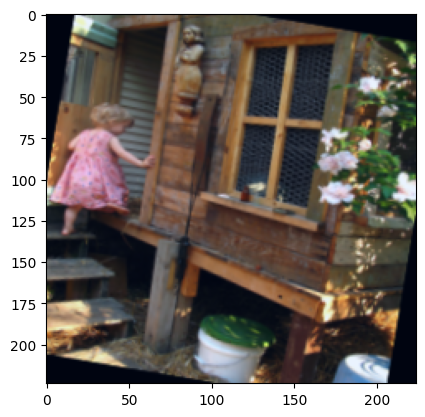

In [22]:
# Проверка на адекватность
plt.figure()
plt.imshow(
    de_normalize(img1.numpy().transpose(1, 2, 0))
)
plt.show()

### 1.5 Даталоадер

In [23]:
from torch.nn.utils.rnn import pad_sequence

In [24]:
# Здесь хотим задать кастомную функцию для того, как именно складывать данные в батч
# Эта функция позже будет передана в collate_fn аргумент даталоадера и будет отвечать за то,
#  как обработать батч и превратить его в тензоры нужного вида

def collate_fn(batch):
    # Функция получает на вход batch - представляет из себя List[el], где каждый el - один вызов __getitem__
    #  вашего датасета
    # На выход вы выдаёте то, что будет выдавать Dataloader на каждом next() из генератора - вы хотите иметь на выходе
    #  несколько тензоров
    
    # Моё предложение по тому как должен выглядеть батч на выходе:
    #   img_batch: [batch_size, num_channels, height, width] --> сложенные в батч изображения
    #   captions_batch: [batch_size, num_captions_per_image, max_seq_len or local_max_seq_len] --> сложенные в
    #       батч заголовки при помощи padding-а
    
    
    images, captions = zip(*batch)
    
    img_batch = torch.stack(images, dim=0)
    captions_batch = nn.utils.rnn.pad_sequence([torch.tensor(c) for c in captions], batch_first=True, padding_value=tok_to_ind['<PAD>'])
    # it's better to work with packed sequences
    
    return img_batch, captions_batch[:, None, :]

In [25]:
batch_size = 4
num_workers = 0

dataloader_train = DataLoader(
    dataset=ds_train,
    batch_size=batch_size,
    collate_fn=collate_fn,
    shuffle=True,
    drop_last=True,
    num_workers=num_workers,
)

dataloader_val = DataLoader(
    dataset=ds_val,
    batch_size=batch_size,
    collate_fn=collate_fn,
    shuffle=False,
    drop_last=False,
    num_workers=num_workers,
)

In [26]:
img_batch, captions_batch = next(iter(dataloader_train))

assert isinstance(img_batch, torch.Tensor)
assert isinstance(captions_batch, torch.Tensor)

assert img_batch.shape[:2] == torch.Size([batch_size, 3])
assert captions_batch.shape[0] == batch_size
assert len(captions_batch.shape) in [2, 3]

assert isinstance(captions_batch.reshape(-1)[0].item(), int)

print("Размер батча изображений: {}\nРазмер батча заголовков: {}".format(img_batch.shape, captions_batch.shape))

Размер батча изображений: torch.Size([4, 3, 224, 224])
Размер батча заголовков: torch.Size([4, 1, 16])


## 2. Составляем модель (***3 балла***)

![](img/photo_2024-02-22%2003.51.43.jpeg)

### 2.1 Фича-экстрактор для изображений

Возьмите какую-нибудь предобученную модель (к примеру resnet), по желанию заморозьте все или часть слоёв, наиболее вероятно уберите последний слой

```python
# выбрать веса нужной вам модели
weights = models.ResNet18_Weights.DEFAULT

# скачать нужную архитекутру модели и инициализировать её весами
model = models.resnet18(weights=weights, progress=True)

# посмотреть какие аугументации использовались в данной модели
weights.transforms()
```

In [27]:
IMG_EMBEDDING_DIM = 512

In [28]:
import torchinfo
torchinfo.summary(torchvision.models.mobilenet_v3_large())

Layer (type:depth-idx)                             Param #
MobileNetV3                                        --
├─Sequential: 1-1                                  --
│    └─Conv2dNormActivation: 2-1                   --
│    │    └─Conv2d: 3-1                            432
│    │    └─BatchNorm2d: 3-2                       32
│    │    └─Hardswish: 3-3                         --
│    └─InvertedResidual: 2-2                       --
│    │    └─Sequential: 3-4                        464
│    └─InvertedResidual: 2-3                       --
│    │    └─Sequential: 3-5                        3,440
│    └─InvertedResidual: 2-4                       --
│    │    └─Sequential: 3-6                        4,440
│    └─InvertedResidual: 2-5                       --
│    │    └─Sequential: 3-7                        10,328
│    └─InvertedResidual: 2-6                       --
│    │    └─Sequential: 3-8                        20,992
│    └─InvertedResidual: 2-7                       --
│    │ 

In [29]:
class img_fe_class(nn.Module):
    def __init__(
        self, 
        text_embedding_dim: int = IMG_EMBEDDING_DIM,
        head_hidden_size: int = 1024
    ) -> None:
        super().__init__()
        
        mobilenet_v3_large = torchvision.models.mobilenet_v3_large(
            weights=torchvision.models.MobileNet_V3_Large_Weights.DEFAULT,
            progress=False
        )
        
        self.backbone = nn.Sequential(
            mobilenet_v3_large.features,
            mobilenet_v3_large.avgpool,
            nn.Flatten(start_dim=1, end_dim=3)
        )
        backbone_out_features = mobilenet_v3_large.classifier[0].in_features  # 960
        
        for p in self.backbone[0][:-1].parameters():
            p.requires_grad = False
                        
        self.head = nn.Sequential(
            nn.Linear(
                in_features=backbone_out_features,
                out_features=head_hidden_size
            ),
            nn.BatchNorm1d(num_features=head_hidden_size),
            nn.Hardswish(inplace=True),
            nn.Dropout(p=0.5, inplace=True),
            nn.Linear(in_features=head_hidden_size, out_features=text_embedding_dim)
        )
        
    def forward(self, imgs):
        return self.head(self.backbone(imgs))

In [30]:
img_fe = img_fe_class()
    
img_features = img_fe(img_batch)

assert len(img_features.shape) == 2
assert img_features.shape[0] == img_batch.shape[0]

print(f'Для изображения возвращает {img_features.shape[1]} фичей')

Для изображения возвращает 512 фичей


### 2.2 Фича-экстрактор для текста

Давайте скачаем предобученные glove вектора и инициализируем nn.Embedding ими, там где мы их знаем

In [31]:
# #!:bash
# wget -O glove.zip https://huggingface.co/stanfordnlp/glove/resolve/main/glove.840B.300d.zip
# # mirror https://nlp.stanford.edu/data/wordvecs/glove.840B.300d.zip

# unzip glove.zip

# ls -sh glove.*

In [32]:
# Открываем glove
np.random.seed(19)

def load_glove_weights(file_path, vocab, pad_token="<PAD>"):
    print("Loading Glove Weights")
    # Инициализируем веса для всех слов стандартным нормальным распределением
    glove_weights = np.random.uniform(0, 1, (len(vocab), 300))
    mask_found = np.zeros(len(vocab), dtype=bool)
    
    # Ищем среди слов в предобученном glove слова из нашего словаря
    with open(file_path, 'r') as f:
        for line in tqdm(f, total=2196018):
            line = line.split()
            token = ' '.join(line[:-300])
            embed = line[-300:]

            # Если нашли, то подменяем эмбеддинг из glove
            if token in vocab:
                ind = vocab[token]
                mask_found[ind] = True
                glove_weights[ind, :] = np.array(list(map(float, embed)), dtype=float)

    print(f"{mask_found.sum()} words from vocab of size {len(vocab)} loaded!")

    glove_weights[vocab[pad_token]] = np.zeros(300, dtype=float)
    return glove_weights, mask_found


glove_path = "../../glove.840B.300d/glove.840B.300d.txt"
glove_weights, mask_found = load_glove_weights(glove_path, tok_to_ind, "<PAD>")

Loading Glove Weights


  0%|          | 0/2196018 [00:00<?, ?it/s]

3470 words from vocab of size 3478 loaded!


-----

Теперь, давайте составим рекурентную модельку для получения фичей из текстов с учётом картинок

Используйте эмбеддинги из картинок в качестве начального состояния скрытого слоя рекурентной нейросети (h_0), если размерности не совпадают, то линейный слой вам в помощь. Если в вашей rnn-like ячейке несколько слоёв, то подавайте в каждый из них.

Вам может пригодиться:

1. библиотека einops - один из самых удобных способов перетасовывать размерности в тензорах, пример:
```python
from einops import rearrange

a = torch.zeros(batch_size, num_captions, max_seq_length, emb_size)
b = rearrange(a, "bs cap seq emb -> (bs cap) seq emb")  # (batch_size * num_captions, max_seq_length, emb_size)
c = rearrange(b, "(bs cap) seq emb -> bs cap seq emb", cap=num_captions)  # (batch_size, num_captions, max_seq_length, emb_size)
```

2. torch.Tensor.repeat() - размножить тензор вдоль одной из размерностей, пример:
```python
a = torch.zeros(3, 5)
b = a[None, :, None, :]  # (1, 3, 1, 5)
c = b.repeat(2, 1, 4, 2)  # (2, 3, 4, 10)
```

In [33]:
TEXT_EMBEDDING_DIM = 300

In [ ]:
class text_fe_class(nn.Module):
    def __init__(
        self,
        text_embedding_dim: int = TEXT_EMBEDDING_DIM,
        img_embedding_dim: int = IMG_EMBEDDING_DIM,
        vocab_size: int = VOCAB_SIZE,
        hidden_size: int = 1024,
        num_layers: int = 2,
        bias: int = True,
        batch_first: bool = True,
        dropout: float = 0.5,
        img_embedding_hidden_size: int = 1024,
        #head_hidden_size: int = 1024,
        max_seq_length: int = 30
    ) -> None:
        super().__init__()
        
        self.max_seq_length = max_seq_length  # ограничим число токенов в выходе при генерации
        
        self.text_embed = nn.Embedding(
            num_embeddings=vocab_size, 
            embedding_dim=text_embedding_dim, 
            padding_idx=tok_to_ind['<PAD>']
        )
        
        self.text_embed.weight = nn.Parameter(
            #torch.randn((VOCAB_SIZE, TEXT_EMBEDDING_DIM)),
            torch.from_numpy(glove_weights).to(dtype=self.text_embed.weight.dtype),
            requires_grad=True,
        )
        
        self.img_embed_fc = nn.Sequential(
            nn.Linear(
                in_features=img_embedding_dim,
                out_features=img_embedding_hidden_size
            ),
            nn.BatchNorm1d(num_features=img_embedding_hidden_size),
            nn.Hardswish(inplace=True),
            nn.Dropout(p=0.5),
            nn.Linear(
                in_features=img_embedding_hidden_size,
                out_features=num_layers * hidden_size  
            )
        )
        
        self.h_0_reshape = num_layers, hidden_size

        self.gru = nn.GRU(
            input_size=text_embedding_dim,
            hidden_size=hidden_size,
            num_layers=num_layers,
            bias=bias,
            batch_first=batch_first,
            dropout=dropout if num_layers > 1 else 0.,
            bidirectional=False
        )
        
        
        # self.head = nn.Sequential(
        #     nn.Linear(
        #         in_features=hidden_size,
        #         out_features=head_hidden_size
        #     ),
        #     nn.BatchNorm1d(normalized_shape=head_hidden_size),
        #     nn.Hardswish(inplace=True),
        #     nn.Dropout(p=0.5),
        #     nn.Linear(
        #         in_features=head_hidden_size,
        #         out_features=vocab_size
        #     )
        # )
        self.head = nn.Sequential(
            nn.Linear(
                in_features=hidden_size,
                out_features=vocab_size
            )
        )
        
    def _get_h0_img(self, img_features):
        h_0_img = self.img_embed_fc(img_features)
        h_0_img = h_0_img.reshape(-1, *self.h_0_reshape).permute(1, 0, 2).contiguous()
        
        return h_0_img
        
    def forward(self, texts, img_features):
        texts_emb = self.text_embed(texts)
        
        h_0_img = self._get_h0_img(img_features)
        
        gru_output, _ = self.gru(texts_emb.squeeze(1), h_0_img)
        
        logits = self.head(gru_output)
        
        return logits[:, None, :]

In [72]:
text_fe = text_fe_class()
text_features = text_fe(captions_batch, img_features)

assert text_features.shape[:-1] == captions_batch.shape
assert len(text_features.shape) in [3, 4]
assert len(text_features.shape) == len(captions_batch.shape) + 1

print(captions_batch.shape)
print(img_features.shape)
print(text_features.shape)

torch.Size([4, 1, 16])
torch.Size([4, 512])
torch.Size([4, 1, 16, 3478])


### 2.3 Финальная модель

In [36]:
from collections import OrderedDict

class image_captioning_model(nn.Module):
    def __init__(
        self,
            text_embedding_dim: int = IMG_EMBEDDING_DIM,
            img_embedding_dim: int = IMG_EMBEDDING_DIM,
            vocab_size: int = VOCAB_SIZE,
            img_fe_head_hidden_size: int = 256,
            text_fe_hidden_size: int = 256,
            text_fe_num_layers: int = 2,
            text_fe_bias: int = True,
            text_fe_batch_first: bool = True,
            text_fe_dropout: float = 0.3,
            text_fe_img_embedding_hidden_size: int = 512,
            text_fe_head_hidden_size: int = 1024,
            max_seq_length: int = 30
        ) -> None:
        super().__init__()
        
        self.img_fe = img_fe_class(
            # text_embedding_dim=text_embedding_dim,
            # head_hidden_size=img_fe_head_hidden_size
        )
        
        self.text_fe = text_fe_class(
            # text_embedding_dim=text_embedding_dim,
            # img_embedding_dim=img_embedding_dim,
            # vocab_size=vocab_size,
            # hidden_size=text_fe_hidden_size,
            # num_layers=text_fe_num_layers,
            # bias=text_fe_bias,
            # batch_first=text_fe_batch_first,
            # dropout=text_fe_dropout,
            # img_embedding_hidden_size=text_fe_img_embedding_hidden_size,
            # head_hidden_size=text_fe_head_hidden_size,
            # max_seq_length=max_seq_length
        )
        
    def encode(self, img_batch: torch.Tensor) -> torch.Tensor:
        return self.img_fe(img_batch)
    
    def decode(self, img_features: torch.Tensor, texts_batch: torch.Tensor) -> torch.Tensor:
        return self.text_fe(texts_batch, img_features)
        
    def forward(self, img_batch: torch.Tensor, texts_batch: torch.Tensor) -> torch.Tensor:
        img_features = self.encode(img_batch)
        text_logits = self.decode(img_features, texts_batch)
        
        return text_logits
        

In [37]:
model = image_captioning_model()

res = model(img_batch, captions_batch)

assert res.shape[:-1] == captions_batch.shape
assert res.shape[-1] == VOCAB_SIZE

print(res.shape)

torch.Size([4, 1, 16, 3478])


In [38]:
from termcolor import colored
from collections import defaultdict

def beautiful_int(i):
    i = str(i)
    return ".".join(reversed([i[max(j, 0):j+3] for j in range(len(i) - 3, -3, -3)]))

# Считаем общее число параметров в нашей модели
def model_num_params(model, verbose_all=True, verbose_only_learnable=False):
    sum_params = 0
    sum_learnable_params = 0
    submodules = defaultdict(lambda : [0, 0])
    for name, param in model.named_parameters():
        num_params = np.prod(param.shape)
        if verbose_all or (verbose_only_learnable and param[1].requires_grad):
            print(
                colored(
                    '{: <42} ~  {: <9} params ~ grad: {}'.format(
                        name,
                        beautiful_int(num_params),
                        param.requires_grad,
                    ),
                    {True: "green", False: "red"}[param[1].requires_grad],
                )
            )
        sum_params += num_params
        sm = name.split(".")[0]
        submodules[sm][0] += num_params
        if param.requires_grad:
            sum_learnable_params += num_params
            submodules[sm][1] += num_params
    print(
        f'\nIn total:\n  - {beautiful_int(sum_params)} params\n  - {beautiful_int(sum_learnable_params)} learnable params'
    )
    
    for sm, v in submodules.items():
        print(
            f"\n . {sm}:\n .   - {beautiful_int(submodules[sm][0])} params\n .   - {beautiful_int(submodules[sm][1])} learnable params"
        )
    return sum_params, sum_learnable_params


sum_params, sum_learnable_params = model_num_params(model)

img_fe.backbone.0.0.0.weight               ~  432       params ~ grad: False
img_fe.backbone.0.0.1.weight               ~  16        params ~ grad: False
img_fe.backbone.0.0.1.bias                 ~  16        params ~ grad: False
img_fe.backbone.0.1.block.0.0.weight       ~  144       params ~ grad: False
img_fe.backbone.0.1.block.0.1.weight       ~  16        params ~ grad: False
img_fe.backbone.0.1.block.0.1.bias         ~  16        params ~ grad: False
img_fe.backbone.0.1.block.1.0.weight       ~  256       params ~ grad: False
img_fe.backbone.0.1.block.1.1.weight       ~  16        params ~ grad: False
img_fe.backbone.0.1.block.1.1.bias         ~  16        params ~ grad: False
img_fe.backbone.0.2.block.0.0.weight       ~  1.024     params ~ grad: False
img_fe.backbone.0.2.block.0.1.weight       ~  64        params ~ grad: False
img_fe.backbone.0.2.block.0.1.bias         ~  64        params ~ grad: False
img_fe.backbone.0.2.block.1.0.weight       ~  576       params ~ grad: False

In [39]:
import torchinfo
torchinfo.summary(model, depth=4)

Layer (type:depth-idx)                                       Param #
image_captioning_model                                       --
├─img_fe_class: 1-1                                          --
│    └─Sequential: 2-1                                       --
│    │    └─Sequential: 3-1                                  --
│    │    │    └─Conv2dNormActivation: 4-1                   (464)
│    │    │    └─InvertedResidual: 4-2                       (464)
│    │    │    └─InvertedResidual: 4-3                       (3,440)
│    │    │    └─InvertedResidual: 4-4                       (4,440)
│    │    │    └─InvertedResidual: 4-5                       (10,328)
│    │    │    └─InvertedResidual: 4-6                       (20,992)
│    │    │    └─InvertedResidual: 4-7                       (20,992)
│    │    │    └─InvertedResidual: 4-8                       (32,080)
│    │    │    └─InvertedResidual: 4-9                       (34,760)
│    │    │    └─InvertedResidual: 4-10              

## 3. Пайплайн обучения (***3 балла***)

### 3.1 Оптимайзер

In [40]:
# class CosineWarmupScheduler(torch.optim.lr_scheduler._LRScheduler):
#     def __init__(self, optimizer: torch.optim.Optimizer, warmup: int, max_epoch, min_lr=1e-8) -> None:
#         self.warmup = warmup
#         self.max_num_iters = max_epoch
#         self.min_lr = min_lr
        
#         super().__init__(optimizer)

#     def get_lr(self):
#         if self.last_epoch == 0:
#             return [self.min_lr]
#         lr_factor = self.get_lr_factor(epoch=self.last_epoch)
#         return [base_lr * lr_factor for base_lr in self.base_lrs]

#     def get_lr_factor(self, epoch):
#         lr_factor = 0.5 * (1 + np.cos(np.pi * epoch / self.max_num_iters))
#         if epoch <= self.warmup:
#             lr_factor *= epoch * 1.0 / self.warmup
#         return lr_factor

In [41]:
# model = torch.nn.Linear(2, 1)
# optimizer = torch.optim.SGD(model.parameters(), lr=0.1)
# scheduler = torch.optim.lr_scheduler.OneCycleLR(
#     optimizer, 
#     max_lr=1e-3, 
#     pct_start=0.3,
#     steps_per_epoch=1,
#     epochs=NUM_EPOCHS,
#     three_phase=False,
#     div_factor=1e3,
#     final_div_factor=1e0
# )
# lrs = []


# for i in range(NUM_EPOCHS):
#     optimizer.step()
#     lrs.append(optimizer.param_groups[0]["lr"])
#     scheduler.step()

# plt.figure()
# plt.title("Scheduler")
# plt.xlabel("Epoch"); plt.ylabel("lr")
# plt.semilogy(lrs, marker='.')
# plt.show()

In [42]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

def create_model_and_optimizer(
    model_class, 
    model_params, 
    device=device
) -> tuple[nn.Module, torch.optim.Optimizer]:
    model = model_class(**model_params)
    model = model.to(device)
    
    optimizer = torch.optim.AdamW(
        params=model.parameters(),
        lr=1e-3,
        weight_decay=1e-8
    )
    
    return model, optimizer

# Убедитесь что всё сработало и создалось нормально и без ошибок
model, optimizer = create_model_and_optimizer(
    model_class=image_captioning_model,
    model_params={},
    device=device
)

### 3.2 Один шаг обучения/валидации

Помните что captions вы используете и как input (`captions[..., seq->0:-1, ...]`) в модель и как target (`captions[..., seq->1:None, ...]`)

In [ ]:
from collections import defaultdict

def train(model, optimizer, loader, criterion):
    model.train()
    losses_tr = []
    for img_batch, captions_batch in tqdm(loader):
        img_batch = img_batch.to(device)
        captions_batch = captions_batch.to(device)
        
        optimizer.zero_grad()
        
        pred = model(img_batch, captions_batch[..., :-1])
        pred = pred.permute(0, 2, 1).contiguous()  # (B, L, C) -> (B, C, L)
        
        target = captions_batch[..., 1:]
        
        loss = criterion(pred, target)
        
        loss.backward()
        optimizer.step()
        losses_tr.append(loss.item())
    
    return model, optimizer, np.mean(losses_tr)


@torch.no_grad()
def val(model, loader, criterion, metric_names=None):
    model.eval()
    losses_val = []
    if metric_names is not None:
        metrics = defaultdict(list)

    for img_batch, captions_batch in tqdm(loader):
        img_batch = img_batch.to(device)
        captions_batch = captions_batch.to(device)
        
        pred = model(img_batch, captions_batch[..., :-1])
        pred = pred.permute(0, 2, 1).contiguous()  # (B, L, C) -> (B, C, L)
        
        target = captions_batch[..., 1:]
        
        loss = criterion(pred, target)

        losses_val.append(loss.item())
        
        if metric_names is not None:
            if 'accuracy' in metric_names:
                preds = torch.argsort(pred, dim=-1, descending=True)
                for k in metric_names["accuracy"]["top"]:
                    # metrics[f'accuracy ~ top#{k}'].append(
                    #     np.mean([target[i][:, None] == preds[i, :k].transpose(0, 1) for i in range(target.shape[0])])  # (B, T); (B, C, T)
                    #     #float(np.mean((target.unsqueeze(1) == preds[:, :k, :]).any(dim=1).to(float).cpu().numpy()))
                    #     #np.mean([torch.isin(target[i], preds[i, :k]).to(float).mean().item() for i in range(target.shape[0])])
                    #     #np.mean([target[i] in preds[i, :k] for i in range(target.shape[0]) if target[i] != to_ids('<PAD>')])
                    # )
                    
                    pos = 0
                    total = 0
                    pad_idx = to_ids('<PAD>')
                    for i in range(target.shape[0]):
                        for c in range(target.shape[1]):
                            if target[i, c] != pad_idx:
                                if target[i, c] in preds[i, :k, c]:
                                    pos += 1
                                total += 1
                    metrics[f'accuracy ~ top#{k}'].append(pos / total)

        # if metric_names is not None:
        #     for name in metrics:
        #         metrics[name] = np.mean(metrics[name])
        
    if metric_names is not None:
        for name in metrics:
            metrics[name] = np.mean(metrics[name])
    
    return np.mean(losses_val), metrics if metric_names else None

### 3.3 Цикл обучения

In [44]:
from IPython.display import clear_output
import warnings
import time
from datetime import timedelta

def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']


def learning_loop(
    model,
    optimizer,
    train_loader,
    val_loader,
    criterion,
    scheduler=None,
    min_lr=None,
    epochs=10,
    val_every=1,
    draw_every=1,
    separate_show=False,
    model_name=None,
    chkp_folder="./chkps",
    metric_names=None,
):
    # Выбираем куда будем сохранять модель
    if model_name is None:
        if os.path.exists(chkp_folder):
            num_starts = len(os.listdir(chkp_folder)) + 1
        else:
            num_starts = 1
        model_name = f'model#{num_starts}'
    else:
        if "#" not in model_name:
            model_name += "#0"
    changed = False
    while os.path.exists(os.path.join(chkp_folder, model_name + '.pt')):
        model_name, ind = model_name.split("#")
        model_name += f"#{int(ind) + 1}"
        changed = True
    if changed:
        warnings.warn(f"Selected model_name was used already! To avoid possible overwrite - model_name changed to {model_name}")
        
    # Инициализируем переменные
    losses = {'train': [], 'val': []}
    lrs = []
    best_val_loss = np.inf
    if metric_names is not None:
        metrics = defaultdict(list)
    start_time = time.monotonic()

    # Цикл обучения
    for epoch in range(1, epochs+1):
        print(f'#{epoch}/{epochs}:')

        lrs.append(get_lr(optimizer))
        
        model, optimizer, loss = train(model, optimizer, train_loader, criterion)
        losses['train'].append(loss)

        # Каждые val_every эпох проводим валидацию
        if not (epoch % val_every):
            loss, metrics_ = val(model, val_loader, criterion, metric_names=metric_names)
            losses['val'].append(loss)
            if metrics_ is not None:
                for name, value in metrics_.items():
                    metrics[name].append(value)
            
            # Сохраняем лучшую по валидации модель
            if loss < best_val_loss:
                if not os.path.exists(chkp_folder):
                    os.makedirs(chkp_folder)
                torch.save(
                    {
                        'epoch': epoch,
                        'model_state_dict': model.state_dict(),
                        'optimizer_state_dict': optimizer.state_dict(),
                        'scheduler_state_dict': scheduler.state_dict(),
                        'losses': losses,
                    },
                    os.path.join(chkp_folder, model_name + '.pt'),
                )
                best_val_loss = loss
            
            # Шаг шедулера
            if scheduler:
                try:
                    scheduler.step()
                except:
                    scheduler.step(loss)

        # Каждые draw_every эпох рисуем графики
        if not (epoch % draw_every):
            clear_output(True)
            ww = 3 if separate_show else 2
            ww_metrics = 0
            if metric_names is not None:
                plot_ids_ = [
                    [key, metric_meta.get("plot_id", 1), metric_meta]
                    for key, metric_meta
                    in metric_names.items()
                ]
                ww_metrics = len(set(el[1] for el in plot_ids_))
                assert all(isinstance(el[1], int) for el in plot_ids_)
                assert all(el[1] <= ww_metrics for el in plot_ids_)
                assert all(el[1] >= 1 for el in plot_ids_)
                
                plot_ids = defaultdict(list)
                for el in plot_ids_:
                    plot_ids[el[1]].append((el[0], el[2]))
                
            fig, ax = plt.subplots(1, ww + ww_metrics, figsize=(16, 10))
            fig.suptitle(f'#{epoch}/{epochs} ~ {timedelta(seconds=time.monotonic() - start_time)}')

            plt.subplot(1, ww + ww_metrics, 1)
            plt.plot(losses['train'], 'r.-', label='train')
            if separate_show:
                plt.title('loss on train')
                plt.legend()
            plt.grid()

            if separate_show:
                plt.subplot(1, ww + ww_metrics, 2)
                plt.title('loss on validation')
                plt.grid()
            else:
                plt.title('losses')
            plt.plot(losses['val'], 'g.-', label='val')
            plt.legend()
            
            plt.subplot(1, ww + ww_metrics, ww)
            plt.title('learning rate')
            plt.plot(lrs, 'g.-', label='lr')
            plt.yscale("log")
            plt.legend()
            plt.grid()
            
            if metric_names is not None:
                for plot_id, keys_meta in plot_ids.items():
                    aggregated_meta = {}
                    plt.subplot(1, ww + ww_metrics, ww + plot_id)
                    if len(keys_meta) > 1:
                        plt.title(f'additional metrics #{plot_id}')
                    elif len(keys_meta) == 1:
                        plt.title(keys_meta[0][0])
                    for key_meta in keys_meta:
                        key, meta = key_meta
                        for meta_key in ["yscale"]:
                            if meta_key in meta:
                                assert meta_key not in aggregated_meta, f"Bad meta data '{meta_key}' doubled inside one plot_id ({plot_id})"
                                aggregated_meta[meta_key] = meta[meta_key]
                        for name in metrics:
                            if key in name:
                                plt.plot(metrics[name], '.-', label=name)
                    plt.yscale(aggregated_meta.get("yscale", "linear"))
                    plt.legend()
                    plt.grid()
            plt.show()
        
        # early_stopping - останавливаем обучение, если LR упал ниже min_lr
        if min_lr and get_lr(optimizer) <= min_lr:
            print(f'Learning process ended with early stop after epoch {epoch}')
            break
    
    return model, optimizer, losses

### 3.4 Обучаем модель

In [45]:
num_epochs = 100

device = torch.device('cuda') #if torch.cuda.is_available() else torch.device('cpu')

model, optimizer = create_model_and_optimizer(
    model_class=image_captioning_model,
    model_params={},
    device=device
)

scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer, 
    max_lr=5e-4, 
    pct_start=0.4,
    steps_per_epoch=1,
    epochs=num_epochs,
    three_phase=False,
    div_factor=1e3,
    final_div_factor=1e0
)

# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
#     optimizer, 
#     patience=5,
#     min_lr=1e-9
# )

criterion = nn.CrossEntropyLoss(ignore_index=tok_to_ind['<PAD>'])

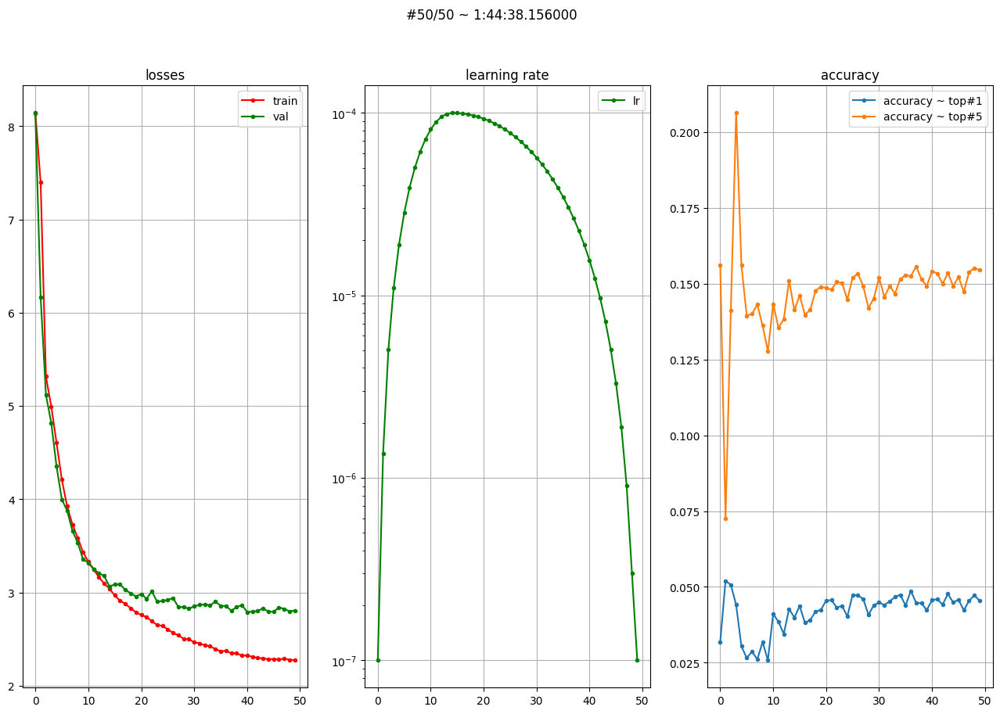

In [46]:
model, optimizer, losses = learning_loop(
    model = model,
    optimizer = optimizer,
    train_loader = dataloader_train,
    val_loader = dataloader_val,
    criterion = criterion,
    scheduler = scheduler,
    epochs = num_epochs,
    min_lr = None,
    val_every = 1,
    draw_every = 1,
    separate_show = False,
    metric_names = {
        "accuracy": {"top": [1, 5], "plot_id": 1},
    },
    chkp_folder = "./chkp",
    model_name = "default",
)

### 3.5 Загрузка чекпоинта

#### **Не запускайте этот блок, если не понимаете для чего это в данную секунду!**

#### **Так можно случайно перезатереть несколько часов вычислений, если не скопировать их в отдельную переменную/чекпоинт**

In [77]:
# assert False, "Are you sure? If not - stop right here, otherwise - comment this assert line"

model_name = "model"
checkpoint = torch.load(os.path.join(".", f"{model_name}.pth"), weights_only=False)

# Создаём те же классы, что и внутри чекпоинта
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

model, optimizer = create_model_and_optimizer(
    model_class=image_captioning_model,
    model_params={},
    device=device
)

torch.optim.lr_scheduler.OneCycleLR(
    optimizer, 
    max_lr=1e-3, 
    pct_start=0.3,
    steps_per_epoch=1,
    epochs=num_epochs,
    three_phase=False,
    div_factor=1e3,
    final_div_factor=1e0
)

# Загружаем состояния из чекпоинта
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
epoch = checkpoint['epoch']
losses = checkpoint['losses']

## 4. Оценка результатов (***2 балл***)

### 4.1 Генерация

In [ ]:
from typing import Optional

# @torch.no_grad()
# def generate(
#     model: nn.Module,
#     image: np.ndarray,
#     max_seq_len: Optional[int] = 15,#30,
#     top_p: Optional[float] = None,
#     top_k: Optional[int] = None,
# ) -> tuple[torch.Tensor, str]:
#     texts = []
#     tokens = []
#     for _ in range(5):
#         tkn, txt = generate_(model, image, max_seq_len, top_p, top_k)
#         texts.append(txt)
#         tokens.append(tkn[0, 0].tolist())
        
#     return tokens, texts

@torch.no_grad()
def generate_greedy(
    model: nn.Module,
    image: np.ndarray,
    max_seq_len: Optional[int] = 15,#30,
    top_p: Optional[float] = None,
    top_k: Optional[int] = None,
) -> tuple[torch.Tensor, str]:
    """
    По картинке image генерируете текст моделью model либо пока не сгенерируете '<EOS>' токен, либо пока не сгенерируете max_seq_len токенов
        top_k -> после получения предсказания оставляете первые top_k слов и сэмплируете случайно с перенормированными вероятностями из оставшихся слов
        top_p -> после получения предсказания оставляете первые сколько-то слов, так, чтобы суммарная вероятность оставшихся слов была не больше top_p,
            после чего сэмплируете с перенормированными вероятностями из оставшихся слов
        иначе -> сэмплируете случайное слово с предсказанными вероятностями
    """
    assert top_p is None or top_k is None, "Don't use top_p and top_k at the same time"
    
    if max_seq_len is None:
        max_seq_len = 1024  # Arbitrary large number if not specified
    
    model.eval()
    
    image_transformed = image_prepare_val(image).unsqueeze(0)
    
    img_features = model.encode(image_transformed)
    
    generated = [tok_to_ind['<BOS>']]
    eos_tok_idx = tok_to_ind['<EOS>']
    
    for _ in range(max_seq_len):
        text_tokens = torch.tensor(generated)[None, None, :]
        
        text_logits = model.decode(img_features, text_tokens)[0]
        
        next_token_logits = text_logits[0, -1, :]
        
        probs = torch.softmax(next_token_logits, dim=-1)
        
        if top_k is not None and top_k > 0:
            top_k_probs, top_k_ids = torch.topk(probs, top_k)
            probs = torch.zeros_like(probs)
            probs[..., top_k_ids] = top_k_probs
            probs[top_k_ids] /= probs[top_k_ids].sum()
        
        elif top_p is not None and top_p > 0:
            sorted_probs, sorted_indices = torch.sort(probs, descending=True)
            cumulative_probs = torch.cumsum(sorted_probs, dim=-1)
            

            sorted_indices_to_remove = cumulative_probs > top_p

            sorted_indices_to_remove[..., 1:] = sorted_indices_to_remove[..., :-1].clone()
            sorted_indices_to_remove[..., 0] = False
            
            indices_to_remove = sorted_indices[sorted_indices_to_remove]
            probs = probs.clone()
            probs[indices_to_remove] = 0
            probs = probs / probs.sum()
            
        next_token = torch.multinomial(probs, num_samples=1).item()
            
        generated.append(next_token)
        if next_token == eos_tok_idx:
            break
        
    result_text = tokens_to_text(text_tokens[0, 0].cpu().numpy().tolist()[1:])
    
    return text_tokens, result_text

In [316]:
@torch.no_grad()
def generate_beam_search(
    model: nn.Module,
    image: np.ndarray,
    max_seq_len: Optional[int] = 30,
    beam_width: int = 10,
) -> tuple[torch.Tensor, str]:
    model.eval()

    image_transformed = image_prepare_val(image).unsqueeze(0)
    img_features = model.encode(image_transformed)
    
    bos_tok_idx = tok_to_ind['<BOS>']
    eos_tok_idx = tok_to_ind['<EOS>']

    beams = torch.full((beam_width, max_seq_len), fill_value=0, dtype=torch.int64)
    beams[:, 0] = bos_tok_idx
    beam_log_probs = torch.zeros(beam_width, dtype=torch.float64)
    beam_completed = torch.full((beam_width, ), fill_value=False)

    for idx in range(1, max_seq_len):
        all_candidates = []
        for beam_i in range(beam_width):
            if beam_completed[beam_i]:
                all_candidates.append((beam_log_probs[beam_i], beams[beam_i].clone(), True))
                continue

            current_seq = beams[beam_i, :idx].unsqueeze(0)  # [1, idx]

            logits = model.decode(
                img_features, current_seq.unsqueeze(1)
            ).squeeze(1)  # [1, seq_len, vocab_size]
            
            next_token_logits = logits[:, -1, :]  # [1, vocab_size]
            log_probs = torch.log_softmax(next_token_logits, dim=-1)  # [1, vocab_size]
            
            topk_log_probs, topk_token_ids = torch.topk(log_probs, k=beam_width, dim=-1)
            topk_log_probs = topk_log_probs.squeeze(0)  # [beam_width]
            topk_token_ids = topk_token_ids.squeeze(0)  # [beam_width]

            for i in range(beam_width):
                candidate_seq = beams[beam_i].clone()
                candidate_seq[idx] = topk_token_ids[i]
                candidate_score = beam_log_probs[beam_i] + topk_log_probs[i]
                candidate_complete = (topk_token_ids[i].item() == eos_tok_idx)
                all_candidates.append((candidate_score, candidate_seq, candidate_complete))
        
        all_candidates.sort(key=lambda x: x[0], reverse=True)
        selected = all_candidates[:beam_width]
        beams = torch.stack([cand[1] for cand in selected])
        beam_log_probs = torch.tensor([cand[0] for cand in selected], dtype=torch.float64)
        beam_completed = torch.tensor([c[2] for c in selected])
        
        if beam_completed.all():
            break

    best_beam_idx = torch.argmax(beam_log_probs)
    best_beam = beams[best_beam_idx]

    if eos_tok_idx in best_beam:
        eos_idx = torch.argwhere(best_beam == eos_tok_idx)[0]
        best_beam = best_beam[:eos_idx]
        
    result_text = tokens_to_text(best_beam[1:].cpu().numpy().tolist())

    return best_beam[None, None, :], result_text


### 4.2 Посмотрим на предсказания модели

In [317]:
def wrap_text(text, max_width):
    words = text.split(" ")
    result = [[words[0]]]
    for word in words[1:]:
        if len(" ".join(result[-1])) + len(word) + 1 > max_width:
            result[-1] = " ".join(result[-1])
            result.append([])
        result[-1].append(word)
    result[-1] = " ".join(result[-1])
    return "\n".join(result)

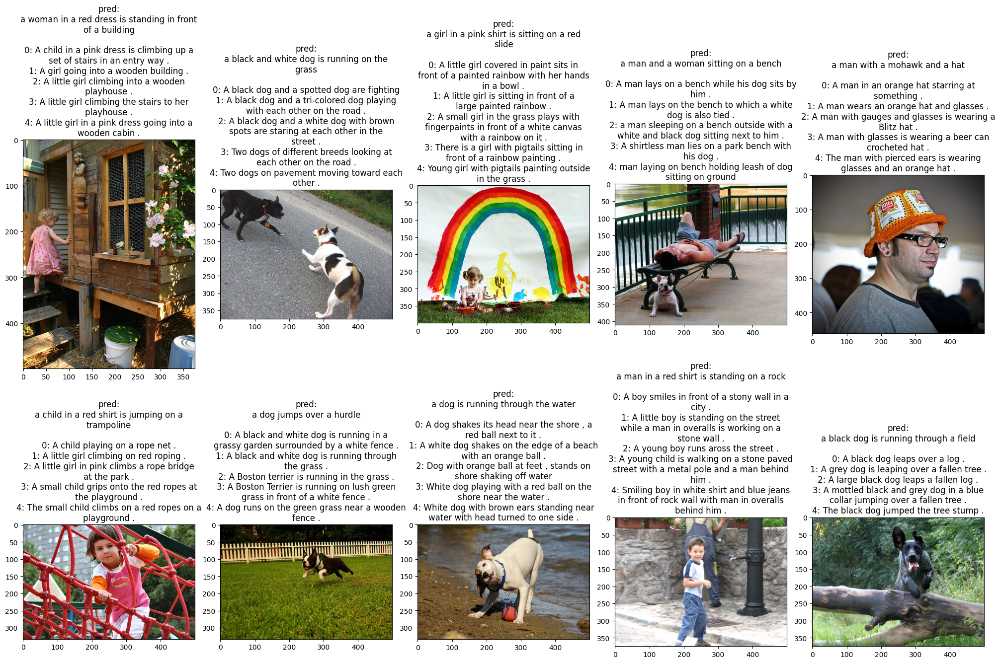

In [319]:
inds = list(range(10))
split = 'train'

h, w = 2, 5
title_width = 43

assert h*w >= len(inds)

fig, ax = plt.subplots(h, w, figsize=(20, 15))

for i, ind in enumerate(inds):
    row = dfs[split].iloc[ind]
    img_id = row['img_id']
    img = cv2.imread(os.path.join(data_folder, split, img_id))
    
    _, pred_caption = generate_beam_search(model.cpu(), img, beam_width=3)#generate(model.cpu(), img, top_k=5)
    pred_caption = wrap_text(pred_caption, title_width)
    
    captions = [row[f'caption #{i}'] for i in range(5)]
    caption_adjasted = "\n".join([f"{i}: " + wrap_text(caption, title_width) for i, caption in enumerate(captions)])
    
    caption = 'pred:\n' + pred_caption + '\n\n' + caption_adjasted
    
    plt.subplot(h, w, i+1)
    plt.title(caption)
    plt.imshow(img)

fig.tight_layout()
plt.show()

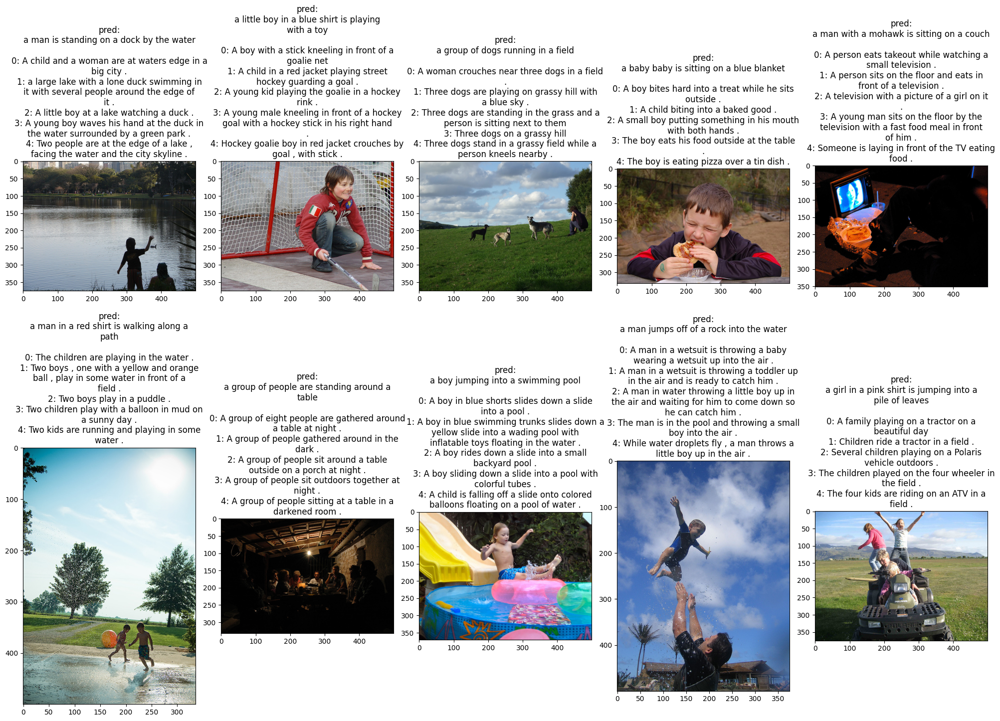

In [320]:
inds = list(range(10))
split = 'val'

h, w = 2, 5
title_width = 43

top_p = None
top_k = 3

assert h*w >= len(inds)

fig, ax = plt.subplots(h, w, figsize=(20, 15))

for i, ind in enumerate(inds):
    row = dfs[split].iloc[ind]
    img_id = row['img_id']
    img = cv2.imread(os.path.join(data_folder, split, img_id))
    
    _, pred_caption = generate_beam_search(model.cpu(), img, beam_width=3) #generate(model, img)
    pred_caption = wrap_text(pred_caption, title_width)
    
    captions = [row[f'caption #{i}'] for i in range(5)]
    caption_adjasted = "\n".join([f"{i}: " + wrap_text(caption, title_width) for i, caption in enumerate(captions)])
    
    caption = 'pred:\n' + pred_caption + '\n\n' + caption_adjasted
    
    plt.subplot(h, w, i+1)
    plt.title(caption)
    plt.imshow(img)

fig.tight_layout()
plt.show()

### 4.3 BLEU на всём val датасете

Тут код уже написан, эта функция будет использоваться в контесте для проверки ваших результатов.

Используйте её для само-проверки на валидационном сете

In [321]:
#from torchtext.data.metrics import bleu_score
from nltk.translate.bleu_score import corpus_bleu

def get_bleu(model, top_p=None, top_k=None, split="val"):
    candidates = []
    references = []
    for ind, row in tqdm(dfs[split].iterrows(), total=dfs[split].shape[0]):
        img_id = row['img_id']
        img = cv2.imread(os.path.join(data_folder, split, img_id))
        references.append([tokenize(row[f'caption #{j}'])[1:-1] for j in range(5)])
        #candidates.append([ind_to_tok[ind.item()] for ind in generate(model, img, top_p=top_p, top_k=top_k)[0][0, 0]])
        candidates.append([ind_to_tok[ind.item()] for ind in generate_beam_search(model, img, beam_width=3)[0][0, 0]])

    # Здесь считается взвешенный BLEU score по 1-4-граммам, оставьте именно так
    b1, b2, b3, b4 = (
        corpus_bleu(references, candidates, weights=(1, 0, 0, 0)),
        corpus_bleu(references, candidates, weights=(0, 1, 0, 0)),
        corpus_bleu(references, candidates, weights=(0, 0, 1, 0)),
        corpus_bleu(references, candidates, weights=(0, 0, 0, 1)),
    )
    return (
        # (b1, b2, b3, b4),
        (b1 + b2 + b3 + b4) / 4,  # Вам нужно добиться большого вот этого значения (см раздел 5.)
        # bleu_score(candidates, references),
    )

In [ ]:
# В том числе экспериментируйте с top_p, top_k и прочим
bleu_res = get_bleu(model, top_p=None, top_k=2)
print(bleu_res)

  0%|          | 0/500 [00:00<?, ?it/s]

## 5. Эксперименты (***3+ баллов***)

В этой части у вас не будет никакого написанного мною кода, а всё что вы здесь будете делать - на ваше усмотрение и по вашей задумке

Цель эксперментов:
**Пройти порог score в соревновании на отложенном тестовом сете**

На Test датасете вам нужно преодолеть следующие пороги:

**0.1** --> **1 балл**

**0.2** --> **2 балла**

**0.3** --> **3 балла**

В зависимости от решений других студентов пороги могут измениться, а за самые лучшие решения мы можем добавить дополнительные баллы.

**Удачи!**